In [4]:
import random
import string
from datetime import datetime, timedelta
import psycopg2
from psycopg2 import sql
from sqlalchemy import create_engine
import json
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
import matplotlib.cm as cm
import seaborn as sns
import matplotlib.ticker as mtick  # Importa el módulo para formatear el eje
import re # Expresiones regulares
from IPython.display import display


In [12]:
# ------------ FUNCIONES ----------------

# 1. Conexión con BD
# 1.1 Con PSYCOPG2
def conexionBDPostgresSQL():
    # Se omiten los datos de conexión.
    conexion = psycopg2.connect(
        dbname="",
        user="",
        password="",
        host="",
        port=""
    )
    return conexion



# 0.
def obtenerDatosBBDD(comandoSQL):
    # Crear conexión y obtener cursor
    conexionBD = conexionBDPostgresSQL() #conexionBDPostgresSQL()
    cursor = conexionBD.cursor()

    # Ejecutar comando y obtener datos
    cursor.execute(comandoSQL)
    registros = cursor.fetchall()

    # Obtener columnas desde el cursor
    columnas = [desc[0] for desc in cursor.description]
    cursor.close()
    conexionBD.close()
    return registros, columnas


# 1. Obtener datos Generación (procesados)
def obtenerDataframeGeneracion():
  comandoSQL_Generacion = "SELECT * FROM tfm.generacion_procesada ORDER BY \"fecha\" ASC"
  datosGeneracion, columnasGeneracion =  obtenerDatosBBDD(comandoSQL_Generacion)
  df_Generacion = pd.DataFrame(datosGeneracion, columns=columnasGeneracion)
  return df_Generacion

# 1.2 Insertar datos Generación
def Generacion_InsertBD_SQLALCHEMY(dataframeGeneracion):
  # Datos de conexión a POSTGRESQL
  usuario = ''
  password = ''
  servidor = ''  
  puerto = ''
  basedatos = ''

  # Crear la URL de conexión
  urlConexion = f'postgresql+psycopg2://{usuario}:{password}@{servidor}:{puerto}/{basedatos}'
  # Motor conexión Postgresql
  engine = create_engine(urlConexion)

  # Tabla y Esquema de BD
  esquemaBD = 'tfm'
  tabla = 'generacion_final'

  # Insertar en BBDD desde un Dataframe
  dataframeGeneracion.to_sql(tabla, engine, schema=esquemaBD, if_exists='append', index=False)


def crearColumnasAnyoMesDia(dataset):
  # Crear nuevas columnas
  dataset['Año'] = dataset['fecha'].dt.year
  dataset['Mes'] = dataset['fecha'].dt.month
  dataset['Dia'] = dataset['fecha'].dt.day
  dataset['DiaSemana'] = dataset['fecha'].dt.weekday + 1  # +1 para que 1=Lunes, ..., 7=Domingo
  return dataset





def generarGraficasDistribucion_2filas_gen(dataset,fecha,mes,dia_semana,columna):

    diccionarioMeses = {
        1: 'Enero',
        2: 'Febrero',
        3: 'Marzo',
        4: 'Abril',
        5: 'Mayo',
        6: 'Junio',
        7: 'Julio',
        8: 'Agosto',
        9: 'Septiembre',
        10: 'Octubre',
        11: 'Noviembre',
        12: 'Diciembre'
    }
    diccionarioDiaSemana = {
        1: 'Lunes',
        2: 'Martes',
        3: 'Miércoles',
        4: 'Jueves',
        5: 'Viernes',
        6: 'Sábado',
        7: 'Domingo'
    }
    # Ajustar tamaño de la figura para 1 fila de 3 gráficos y 1 fila de 1 gráfico que ocupe todo el ancho
    fig = plt.figure(figsize=(15, 10), dpi=300)
    # Crear subplots manualmente
    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=1)
    ax2 = plt.subplot2grid((3, 3), (0, 1), colspan=1)
    ax3 = plt.subplot2grid((3, 3), (0, 2), colspan=1)
    ax4 = plt.subplot2grid((3, 3), (1, 0), colspan=3, rowspan=1)  # Este eje ocupa toda la segunda fila
    
    # Generación por día de la semana
    
    # Agrupar los datos por la columna especificada y calcular la media de los valores en esos grupos
    df_agrupado_dia = dataset.groupby(dia_semana)[columna].mean().reset_index()

    # Calcular la media global de la columna agrupada (después de agrupar)
    media_global = df_agrupado_dia[columna].mean()
    
    etiquetas_traducidas_dia = [diccionarioDiaSemana.get(label, label) for label in df_agrupado_dia[dia_semana]]

    # Crear el gráfico de barras
    bar_positions = range(len(df_agrupado_dia[columna]))
    ax1.bar(bar_positions, df_agrupado_dia[columna], color='lightcoral')

    # Añadir la línea de la media global de los valores agrupados
    ax1.axhline(y=media_global, color='red', linestyle='--', label=f'Valor medio: ({media_global:.2f})')
    # Reducir el tamaño de la leyenda
    ax1.legend(loc='upper right', framealpha=0.5, fontsize='small')


    # Añadir etiquetas y título
    #ax1.xlabel(columna_para_agrupar.capitalize())
    #ax1.ylabel('Valor generación media')
    ax1.set_title(f'Generación por día de la semana de: {columna.upper()}')

    # Configurar xticks manualmente para mostrar todas las etiquetas correctamente alineadas
    ax1.set_xticks(ticks=bar_positions, labels=etiquetas_traducidas_dia, rotation=45, ha='right')

    # Generación por mes
    
    # Agrupar los datos por la columna especificada y calcular la media de los valores en esos grupos
    df_agrupado_mes = dataset.groupby(mes)[columna].mean().reset_index()

    # Calcular la media global de la columna agrupada (después de agrupar)
    media_global = df_agrupado_mes[columna].mean()

    # Crear el gráfico de barras
    bar_positions = range(len(df_agrupado_mes[columna]))
    ax2.bar(bar_positions, df_agrupado_mes[columna], color='khaki')

    # Añadir la línea de la media global de los valores agrupados
    ax2.axhline(y=media_global, color='red', linestyle='--', label=f'Valor medio: ({media_global:.2f})')
    # Reducir el tamaño de la leyenda
    ax2.legend(loc='upper right', framealpha=0.5, fontsize='small')

    etiquetas_traducidas_mes = [diccionarioMeses.get(label, label) for label in df_agrupado_mes[mes]]

    # Añadir etiquetas y título
    #ax2.xlabel(columna_para_agrupar.capitalize())
    #ax2.ylabel('Valor generación media')
    ax2.set_title(f'Generación por mes del año de: {columna.upper()}')

    # Configurar xticks manualmente para mostrar todas las etiquetas correctamente alineadas
    #plt.xticks(ticks=bar_positions, labels=etiquetas_traducidas, rotation=45, ha='right')


    # Histograma
    sns.histplot(dataset[columna], kde=True, ax=ax3,  color='paleturquoise')
    ax3.set_title(f'Histograma de: {columna.upper()}')
    #ax2.set_xticklabels(ax2.get_xticklabels(), rotation=30, ha='right')
    #ax2.tick_params(axis='x', labelsize=8.5) # Sólo si se solapan los textos
    #ax2.set_ylabel('Etiqueta EJE Y')
    
    #Serie temportal

    if not pd.api.types.is_datetime64_any_dtype(dataset['fecha']):
        dataset['fecha'] = pd.to_datetime(dataset['fecha'])

    ax4.plot(dataset['fecha'], dataset[columna], linestyle='-', color='plum')
    ax4.set_title(f'Serie Temporal de: {columna.upper()}')
    ax4.set_xlabel('Fecha')
    ax4.set_ylabel('Valor')

    # Establecer el formato del eje x para mostrar cada año
    ax4.xaxis.set_major_locator(mdates.YearLocator())
    ax4.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Añadir líneas verticales punteadas en cada año
    years = mdates.YearLocator()  # Localizador de años
    for year_loc in years.tick_values(dataset['fecha'].min(), dataset['fecha'].max()):
        ax4.axvline(x=year_loc, color='gray', linestyle='dashed', linewidth=1)

    plt.setp(ax4.xaxis.get_majorticklabels(), rotation=0)  # Rotar las etiquetas si es necesario para mejor visualización
    
    # Use the pyplot interface to change just one subplot...
    
    plt.sca(ax2)
    plt.xticks(ticks=bar_positions, labels=etiquetas_traducidas_mes, rotation=45, ha='right')

    plt.tight_layout()
    plt.savefig(f'generacion_{columna}.jpg')
    plt.show()




## Generacion
Ahora que ya hemos creado todas las funciones que vamos a usar en este análisis, vamos a importar los datos a un dataframe y empezar a trabajar con ellos.

In [14]:
# 1. Generación
dataframeGeneracion = obtenerDataframeGeneracion()
# Asegurar que todos los dataframe tiene un campo llamado "fecha"
dataframeGeneracion = dataframeGeneracion.rename(columns={'fechaGeneracion': 'fecha'})
dataframeGeneracion.dtypes

fecha                  datetime64[ns]
Carbon_NR                     float64
CicloCombinado_NR             float64
Cogeneracion_NR               float64
Eolica_R                      float64
FuelGas_NR                    float64
Hidroeolica_R                 float64
Hidraulica_R                  float64
MotorDiesel_NR                float64
Nuclear_NR                    float64
OtrasRenovables_R             float64
SolarFotovoltaica_R           float64
SolarTermica_R                float64
TurbinaGas_NR                 float64
TurbinaVapor_NR               float64
TurbinaBombeo_NR              float64
ResiduosNoRenov_NR            float64
ResiduosRenov_R               float64
GeneracionTotal               float64
dtype: object

Como los tipos de datos se han importado bien desde la tabla de PostgreSQL no es necesario hacer ninguna transformación, vamos a usar la función describe para ver un resumen de los datos del dataframe

In [16]:
dataframeGeneracion.describe(include='all')

,fecha,Carbon_NR,CicloCombinado_NR,Cogeneracion_NR,Eolica_R,FuelGas_NR,Hidroeolica_R,Hidraulica_R,MotorDiesel_NR,Nuclear_NR,OtrasRenovables_R,SolarFotovoltaica_R,SolarTermica_R,TurbinaGas_NR,TurbinaVapor_NR,TurbinaBombeo_NR,ResiduosNoRenov_NR,ResiduosRenov_R,GeneracionTotal
count,5114,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.000000,5114.0,5114.000000,5114.000000,5114.000000
mean,2017-12-31 12:00:00,76133.156471,110752.383622,70498.801993,145583.632071,-3.253926,39.276780,79837.285683,8288.337208,150686.297644,10646.496643,43014.981612,12122.577049,2090.537916,5488.001624,0.0,5404.437871,2163.909772,722746.860035
min,2011-01-01 00:00:00,-1038.624000,22726.758000,17237.369000,9687.570000,-105.095000,-7.750000,12758.185000,4579.061000,78628.552000,4805.477000,3739.349000,0.000000,90.346000,563.573000,0.0,1145.669000,575.595500,498472.867000
25%,2014-07-02 06:00:00,14264.025000,64730.676000,63445.343750,84466.433750,-1.212250,0.000000,49832.968000,7190.865750,141031.844250,9682.433000,19798.162750,3585.352750,1354.846000,3727.904750,0.0,4220.214625,1924.396500,670625.559000
50%,2017-12-31 12:00:00,49534.986000,92430.257000,73572.441000,129070.649000,0.000000,20.974000,70398.039500,8404.632000,155771.581500,10507.412500,28436.538000,9603.587500,2002.106000,5796.146000,0.0,5392.149750,2289.000500,721970.788000
75%,2021-07-01 18:00:00,136867.995000,143754.480750,80578.591000,191752.336750,0.000000,70.795500,101430.569000,9377.662000,168004.973250,11602.327000,51929.746250,20343.209500,2753.661250,7122.151750,0.0,6650.669125,2540.249625,773687.178500
max,2024-12-31 00:00:00,238179.267000,396453.645000,103089.470000,441021.500000,64.740000,157.381000,250695.190000,12026.109000,180165.816000,15494.952000,211982.286000,33388.129000,5220.280000,9520.979000,0.0,8820.699000,3060.777500,982078.507000
std,NaN,66469.835438,61744.455603,16620.246075,78495.355615,8.997701,43.739404,40566.271103,1467.400169,20848.087559,1670.471378,38469.431760,9521.426100,967.551101,1927.068952,0.0,1489.730497,504.670460,74889.234804


Analizando la información del esquema anterior, vemos que hay valores negativos en algunas fuentes generadoras de energía, esto la red eléctrica española lo justifica diciendo que en ese dia la energía consumida por la planta energética supero a la generada.

Aún así esto no es algo que queramos tener en nuestro dataset, asi que vamos a buscar los valores negativos y los vamos a convertir en 0.

Por otro lado tambien vemos que hay una columna que siempre tiene como valor 0, esta columna la vamos a eliminar ya que no nos aporta ninguna información.

In [18]:
for columna in dataframeGeneracion.select_dtypes(include=['float64']).columns:
    num_negativos = (dataframeGeneracion[columna] < 0).sum()
    if num_negativos > 0:
        print(f"{columna}: {num_negativos} registros con valores negativos")

# Suponiendo que 'fecha' es la columna que contiene las fechas en el DataFrame
# y que 'dataframeGeneracion' es tu DataFrame original.

print("Columnas con algún valor negativo y las fechas asociadas:")

for columna in dataframeGeneracion.select_dtypes(include=['float64']).columns:
    # Filtrar registros donde el valor en la columna es negativo
    negativos = dataframeGeneracion[dataframeGeneracion[columna] < 0]

    # Si hay registros negativos, mostrar la columna y las fechas
    if not negativos.empty:
        print(f"\n{columna}:")
        print(negativos[['fecha', columna]])


Carbon_NR: 6 registros con valores negativos
FuelGas_NR: 1354 registros con valores negativos
Hidroeolica_R: 125 registros con valores negativos
Columnas con algún valor negativo y las fechas asociadas:

Carbon_NR:
          fecha  Carbon_NR
3408 2020-05-01  -1038.624
3675 2021-01-23   -643.438
3676 2021-01-24   -578.996
3682 2021-01-30   -465.722
3683 2021-01-31   -484.084
3690 2021-02-07   -546.315

FuelGas_NR:
          fecha  FuelGas_NR
0    2011-01-01     -49.996
1    2011-01-02     -50.202
2    2011-01-03     -23.273
3    2011-01-04     -10.819
4    2011-01-05     -21.856
...         ...         ...
3858 2021-07-25      -0.001
3883 2021-08-19      -0.001
3913 2021-09-18      -0.001
4285 2022-09-25      -0.001
4310 2022-10-20      -0.001

[1354 rows x 2 columns]

Hidroeolica_R:
          fecha  Hidroeolica_R
1289 2014-07-13         -0.827
1290 2014-07-14         -1.370
1291 2014-07-15         -0.584
1292 2014-07-16         -0.634
1293 2014-07-17         -0.853
...         ...     

In [20]:
# Paso 1: Analizar las columnas que contienen algún valor "negativo"
print("Columnas con algún valor negativo")
for columna in dataframeGeneracion.select_dtypes(include=['float64']).columns:
    if (dataframeGeneracion[columna] < 0).any():
        print(f'\tLa columna "{columna}" tiene valores negativos')
for columna in dataframeGeneracion.select_dtypes(include=['float64']).columns:
    num_negativos = (dataframeGeneracion[columna] < 0).sum()
    if num_negativos > 0:
        print(f"{columna}: {num_negativos} registros con valores negativos")

# Paso 2: Imputación de valores negativos
print("Imputar '0' en valores negativos")
for columna in dataframeGeneracion.select_dtypes(include=['float64']).columns:
    if (dataframeGeneracion[columna] < 0).any():
        print(f'\tColumna "{columna}" corregida')
        dataframeGeneracion[columna] = dataframeGeneracion[columna].apply(lambda x: 0 if x < 0 else x)

# Paso 3: Comprobación
print("Comprobación tras corrección de varlores nulos")
for columna in dataframeGeneracion.select_dtypes(include=['float64']).columns:
    if (dataframeGeneracion[columna] < 0).any():
        print(f'\tLa columna "{columna}" tiene valores negativos')

Columnas con algún valor negativo
	La columna "Carbon_NR" tiene valores negativos
	La columna "FuelGas_NR" tiene valores negativos
	La columna "Hidroeolica_R" tiene valores negativos
Carbon_NR: 6 registros con valores negativos
FuelGas_NR: 1354 registros con valores negativos
Hidroeolica_R: 125 registros con valores negativos
Imputar '0' en valores negativos
	Columna "Carbon_NR" corregida
	Columna "FuelGas_NR" corregida
	Columna "Hidroeolica_R" corregida
Comprobación tras corrección de varlores nulos


In [30]:
print("Dimensiones: ", dataframeGeneracion.shape)

Dimensiones:  (5114, 20)


Veamos ahora que no hay valores duplicados en nuestro dataset.

In [32]:
# Comprobar si hay duplicados
duplicados = dataframeGeneracion.duplicated()

# Mostrar los registros duplicados (esto incluye la primera aparición)
df_duplicados = dataframeGeneracion[duplicados]

# Mostrar el resultado
print("Registros duplicados:")
print(df_duplicados)

Registros duplicados:
Empty DataFrame
Columns: [fecha, Carbon_NR, CicloCombinado_NR, Cogeneracion_NR, Eolica_R, FuelGas_NR, Hidroeolica_R, Hidraulica_R, MotorDiesel_NR, Nuclear_NR, OtrasRenovables_R, SolarFotovoltaica_R, SolarTermica_R, TurbinaGas_NR, TurbinaVapor_NR, TurbinaBombeo_NR, ResiduosNoRenov_NR, ResiduosRenov_R, UnidadMedida, GeneracionTotal]
Index: []


Por último, vamos a crear las columnas necesaria para los visuales, estas son las columnas de año, mes, dia y dia de la semana.

In [22]:
dataframeGeneracion = crearColumnasAnyoMesDia(dataframeGeneracion)
dataframeGeneracion.head()

,fecha,Carbon_NR,CicloCombinado_NR,Cogeneracion_NR,Eolica_R,FuelGas_NR,Hidroeolica_R,Hidraulica_R,MotorDiesel_NR,Nuclear_NR,...,TurbinaGas_NR,TurbinaVapor_NR,TurbinaBombeo_NR,ResiduosNoRenov_NR,ResiduosRenov_R,GeneracionTotal,Año,Mes,Dia,DiaSemana
0,2011-01-01,63539.183,142852.659,60034.044,30530.962,0.0,0.0,132922.642,9421.646,156043.256,...,635.928,6335.737,0.0,3476.6190,2075.1250,624314.058,2011,1,1,6
1,2011-01-02,63250.905,105985.984,67987.652,120932.782,0.0,0.0,122475.160,9583.460,155946.404,...,760.919,7312.269,0.0,3541.8645,1974.4885,680025.145,2011,1,2,7
2,2011-01-03,99351.269,220507.008,89705.195,77934.616,0.0,0.0,146861.638,10031.223,155911.784,...,1936.269,8551.252,0.0,3601.8935,1996.4985,839062.194,2011,1,3,1
3,2011-01-04,115105.686,203996.354,93111.247,104022.723,0.0,0.0,145876.053,10024.313,156264.172,...,2079.062,8355.284,0.0,3409.9720,1783.8130,863316.984,2011,1,4,2
4,2011-01-05,71928.723,111598.224,90420.805,200221.686,0.0,0.0,158946.134,10067.259,156313.258,...,1454.871,8234.295,0.0,3482.2830,1746.2820,833310.877,2011,1,5,3


Y podemos sacar ya los gráficos, vamos a obtener una gráfica por cada columna de generación de energía.

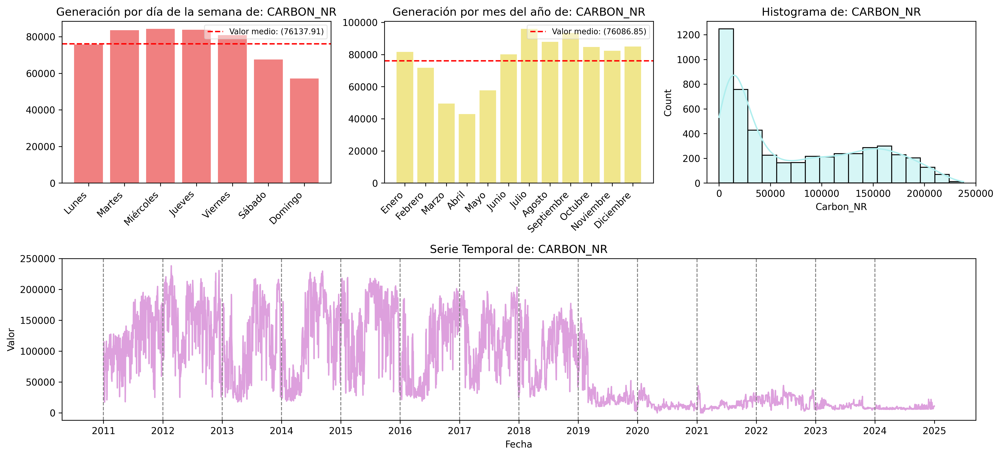

In [152]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','Carbon_NR')

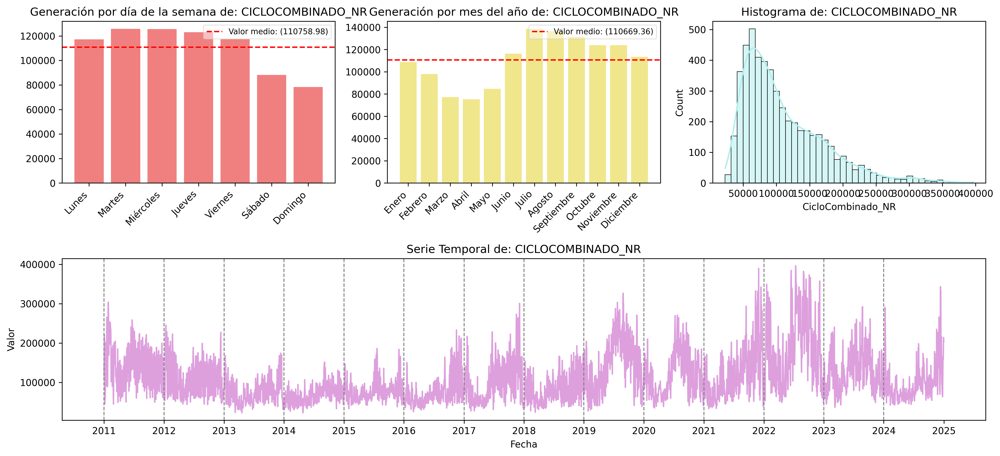

In [153]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','CicloCombinado_NR')

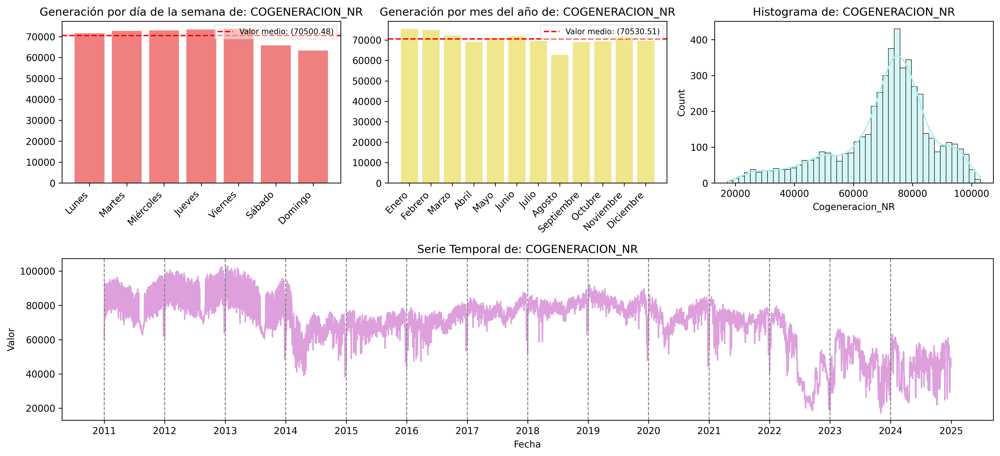

In [156]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','Cogeneracion_NR')

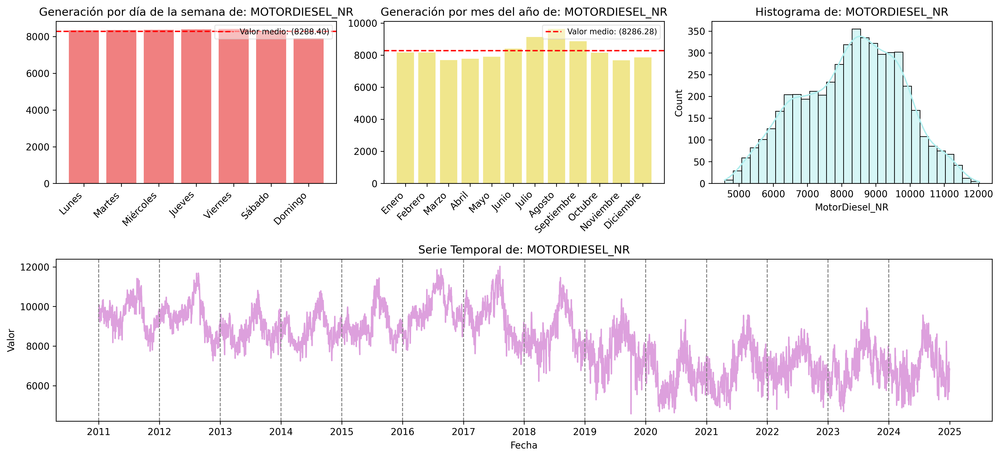

In [158]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','MotorDiesel_NR')

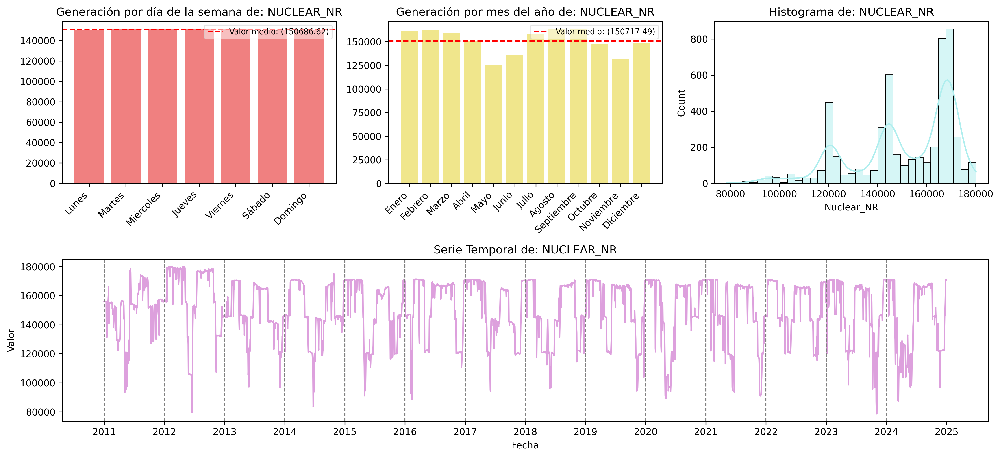

In [160]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','Nuclear_NR')

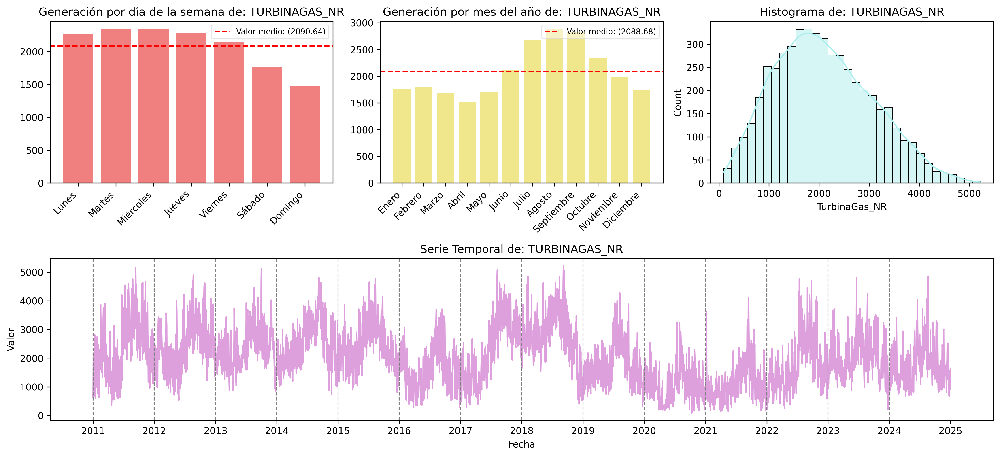

In [162]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','TurbinaGas_NR')

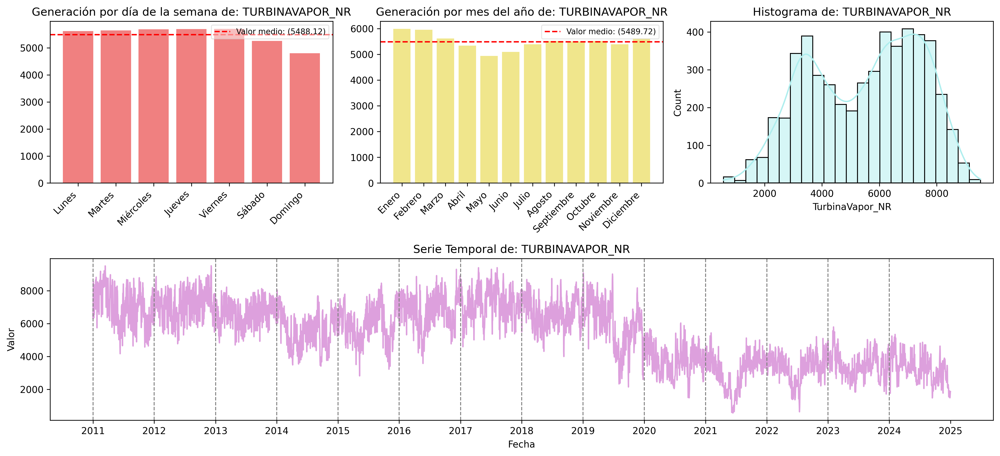

In [163]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','TurbinaVapor_NR')

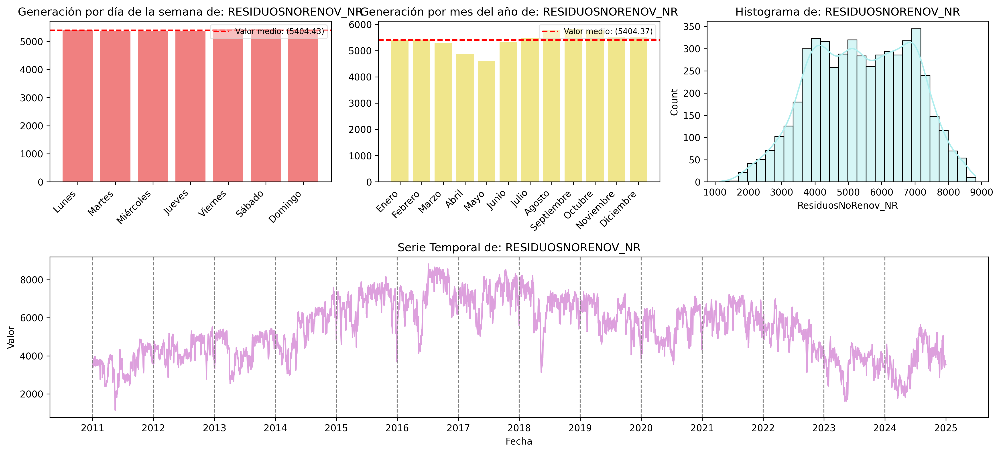

In [166]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','ResiduosNoRenov_NR')

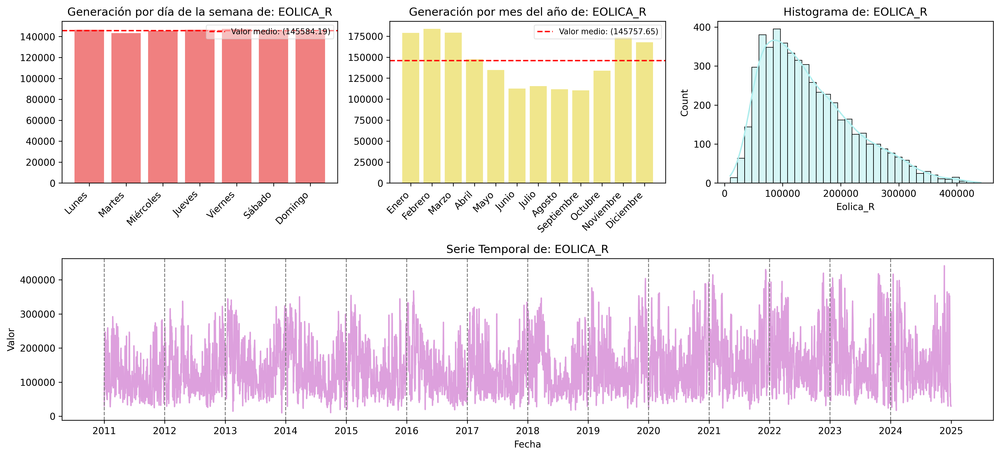

In [168]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','Eolica_R')

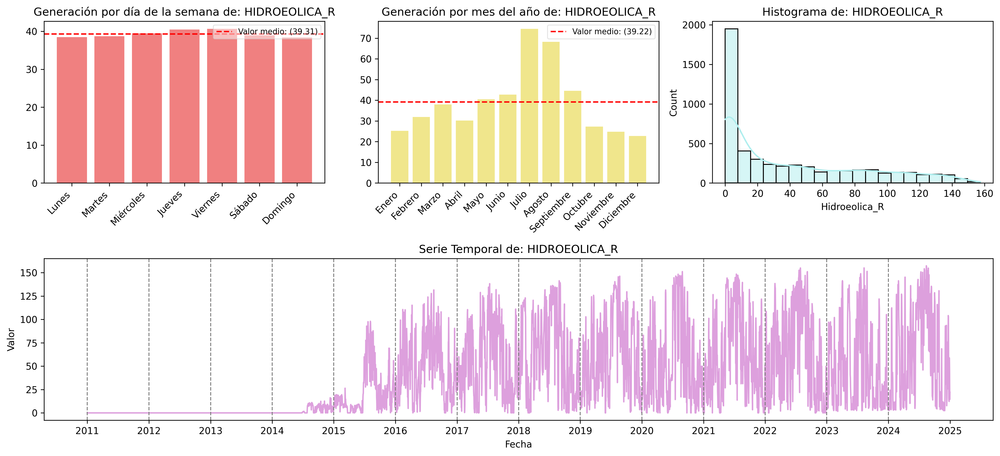

In [169]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','Hidroeolica_R')

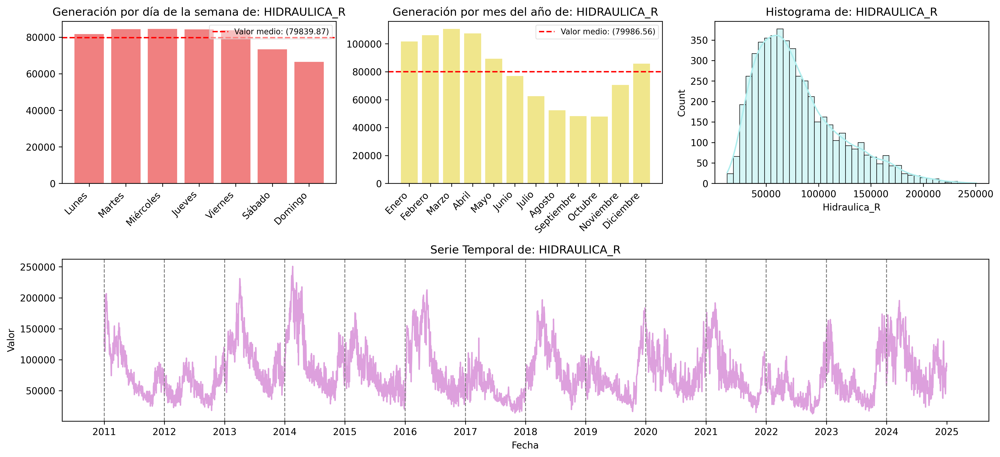

In [172]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','Hidraulica_R')

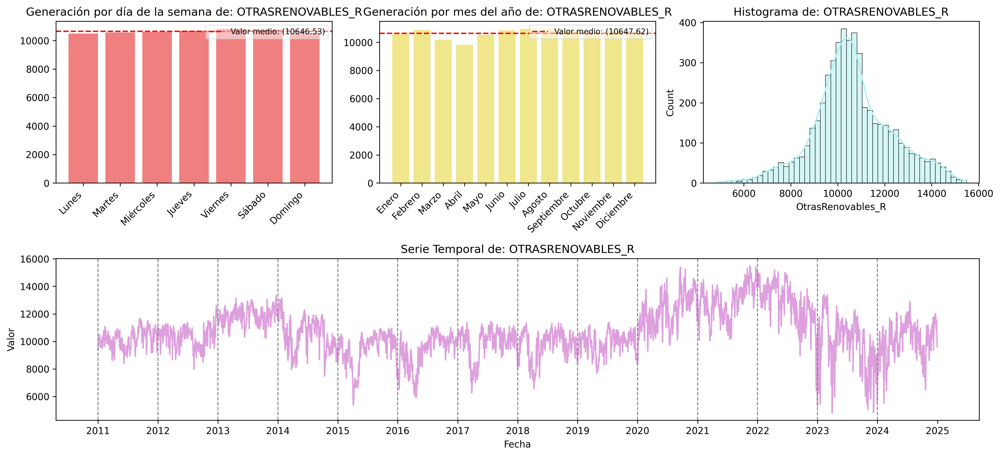

In [176]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','OtrasRenovables_R')

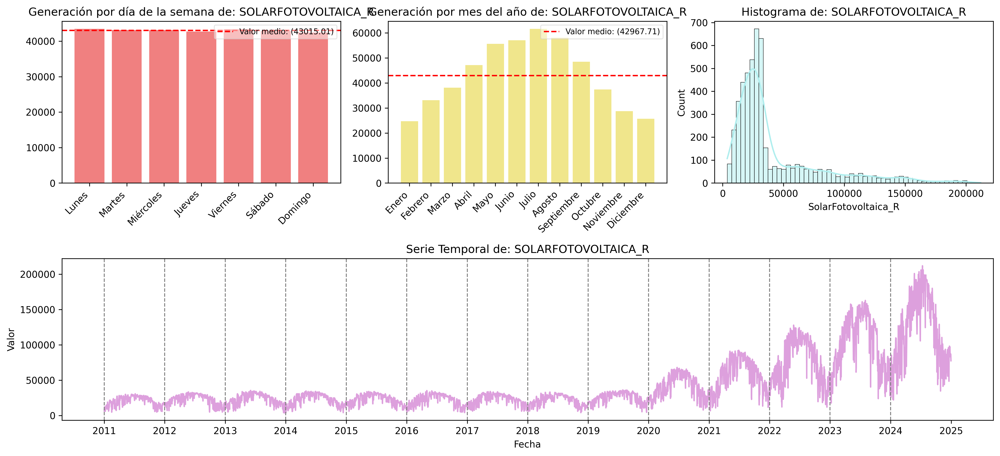

In [177]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','SolarFotovoltaica_R')

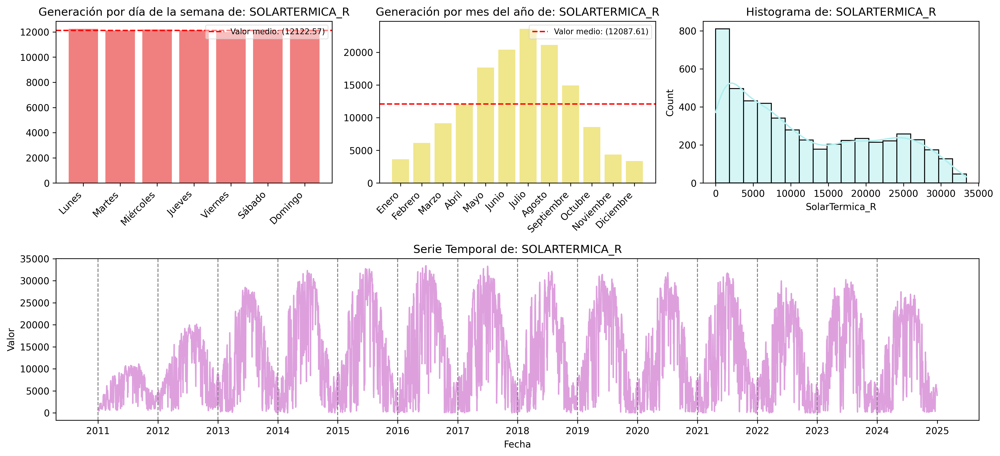

In [180]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','SolarTermica_R')

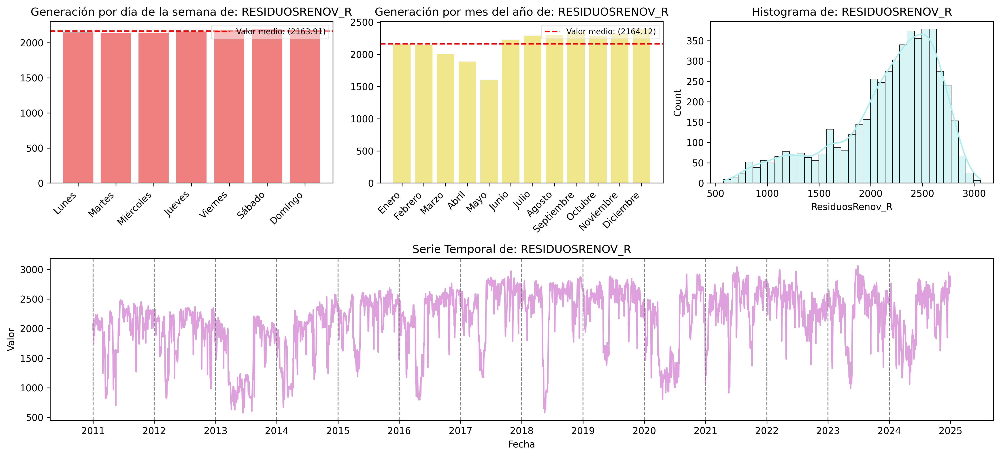

In [181]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','ResiduosRenov_R')

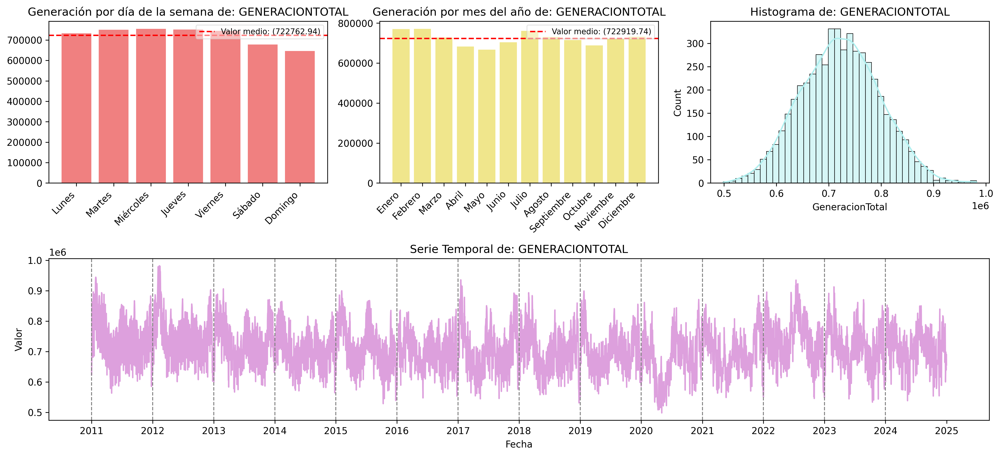

In [184]:
generarGraficasDistribucion_2filas_gen(dataframeGeneracion,'fecha','Mes','DiaSemana','GeneracionTotal')

Con esto damos por finalizada la parte del análisis de los datos de generación

In [24]:
Generacion_InsertBD_SQLALCHEMY(dataframeGeneracion)